# Analytical Model

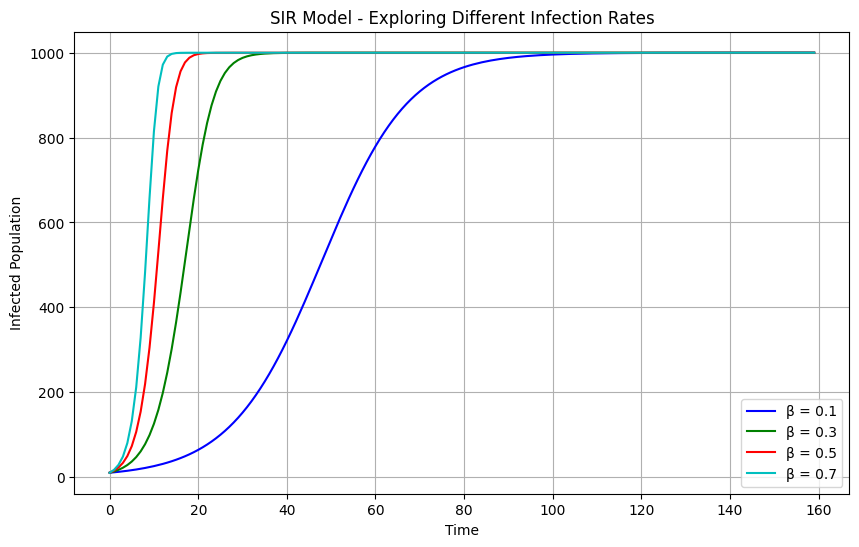

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
gamma = 0  # Recovery rate
S0 = 990     # Initial number of susceptible individuals
I0 = 10      # Initial number of infected individuals
R0 = 0       # Initial number of recovered individuals
N = S0 + I0 + R0  # Total population
t_max = 160  # Total time
dt = 1       # Time step

# Number of steps
n_steps = int(t_max / dt)

# Infection rates to explore
beta_values = [0.1, 0.3, 0.5, 0.7]

# Colors for different plots
colors = ['b', 'g', 'r', 'c']

plt.figure(figsize=(10, 6))

for idx, beta in enumerate(beta_values):
    # Arrays to store the results
    S = np.zeros(n_steps)
    I = np.zeros(n_steps)
    R = np.zeros(n_steps)
    t = np.zeros(n_steps)

    # Initial conditions
    S[0] = S0
    I[0] = I0
    R[0] = R0

    # Euler method to solve the ODEs
    for step in range(1, n_steps):
        S[step] = S[step - 1] - (beta * S[step - 1] * I[step - 1] / N) * dt
        I[step] = I[step - 1] + (beta * S[step - 1] * I[step - 1] / N - gamma * I[step - 1]) * dt
        R[step] = R[step - 1] + (gamma * I[step - 1]) * dt
        t[step] = t[step - 1] + dt

    # Plot the results for this beta value
    plt.plot(t, I, label=f'β = {beta}', color=colors[idx])

plt.xlabel('Time')
plt.ylabel('Infected Population')
plt.title('SIR Model - Exploring Different Infection Rates')
plt.legend()
plt.grid(True)
plt.show()


# ABM on lattice

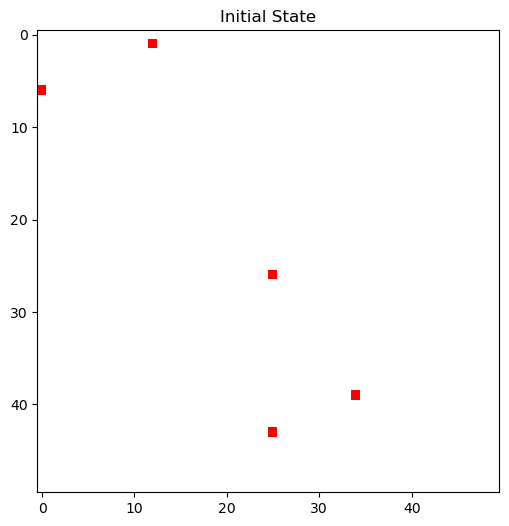

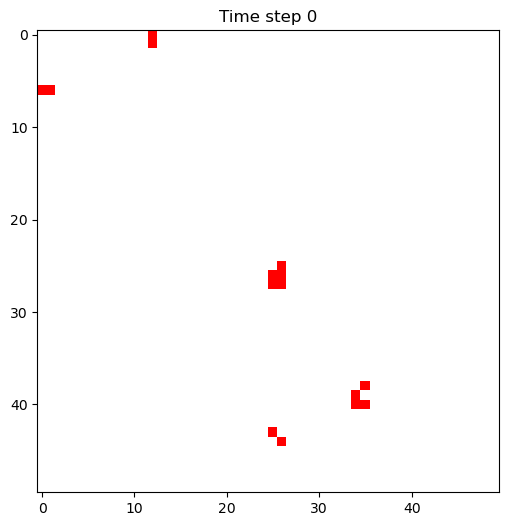

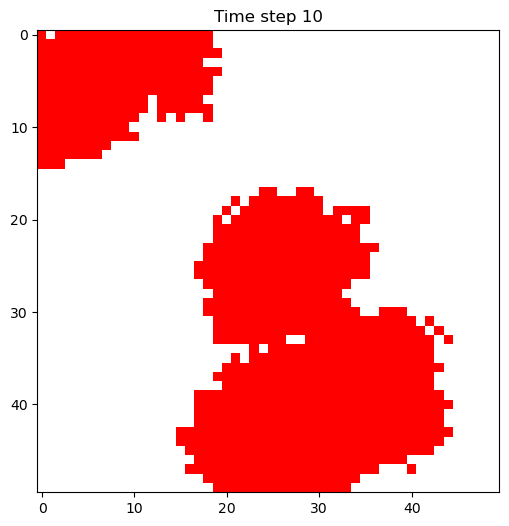

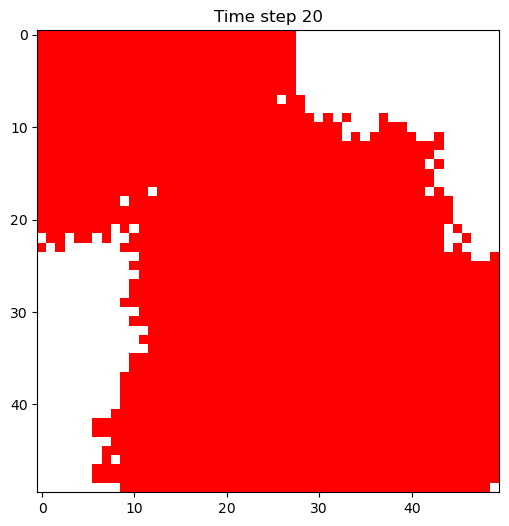

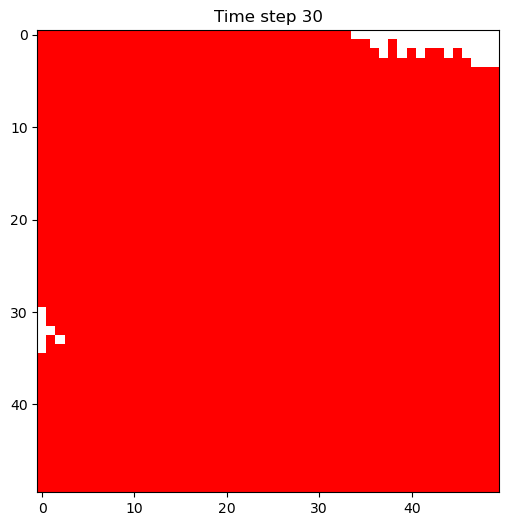

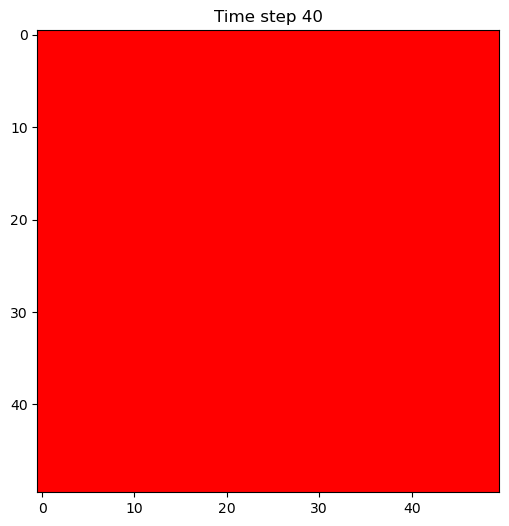

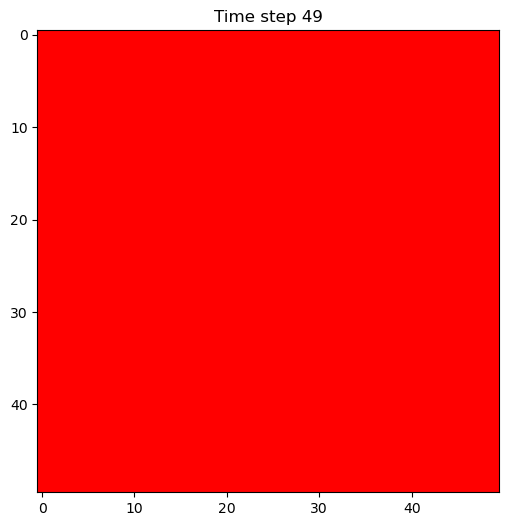

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Grid size
grid_size = 50

# Infection probability and recovery probability
beta = 0.3
gamma = 0

# Initialize the grid with all susceptible individuals
grid = np.zeros((grid_size, grid_size), dtype=int)

# Initial number of infected individuals
initial_infected = 5
for _ in range(initial_infected):
    x, y = np.random.randint(0, grid_size, 2)
    grid[x, y] = 1  # Infected state

# Define the colors for the plot
cmap = mcolors.ListedColormap(['white', 'red', 'green'])
bounds = [-0.5, 0.5, 1.5, 2.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Function to update the grid
def update_grid(grid):
    new_grid = grid.copy()
    for i in range(grid_size):
        for j in range(grid_size):
            if grid[i, j] == 1:  # Infected
                if np.random.rand() < gamma:
                    new_grid[i, j] = 2  # Recovered
                else:
                    # Try to infect neighbors
                    for di in [-1, 0, 1]:
                        for dj in [-1, 0, 1]:
                            ni, nj = i + di, j + dj
                            if 0 <= ni < grid_size and 0 <= nj < grid_size and grid[ni, nj] == 0:
                                if np.random.rand() < beta:
                                    new_grid[ni, nj] = 1  # Infect the neighbor
    return new_grid

# Number of time steps
n_steps = 50

# Plot the initial grid
plt.figure(figsize=(6, 6))
plt.imshow(grid, cmap=cmap, norm=norm)
plt.title('Initial State')
plt.show()

# Simulation loop
for step in range(n_steps):
    grid = update_grid(grid)
    if step % 10 == 0 or step == n_steps - 1:
        plt.figure(figsize=(6, 6))
        plt.imshow(grid, cmap=cmap, norm=norm)
        plt.title(f'Time step {step}')
        plt.show()


# ABM with network

/opt/anaconda3/lib/python3.9/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


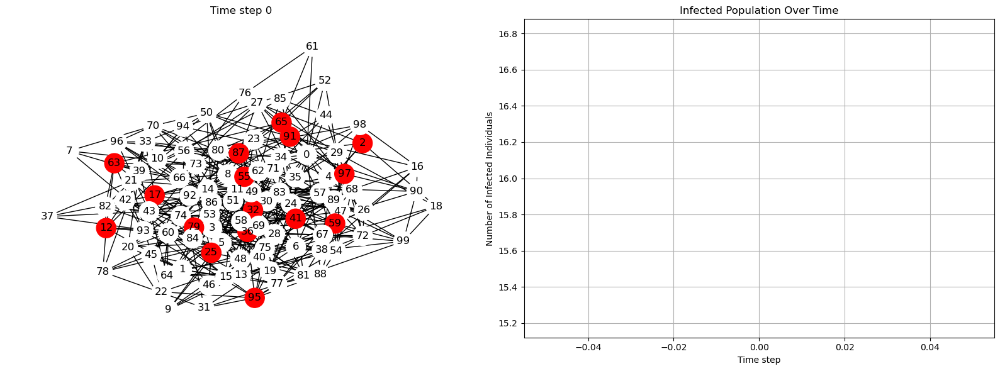

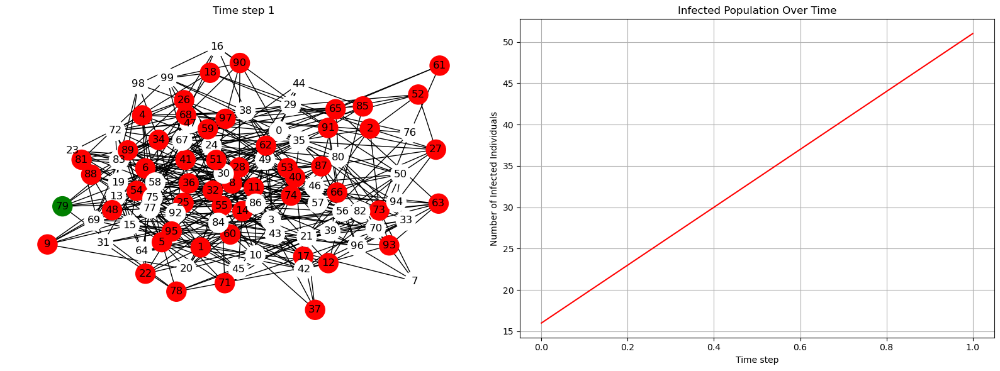

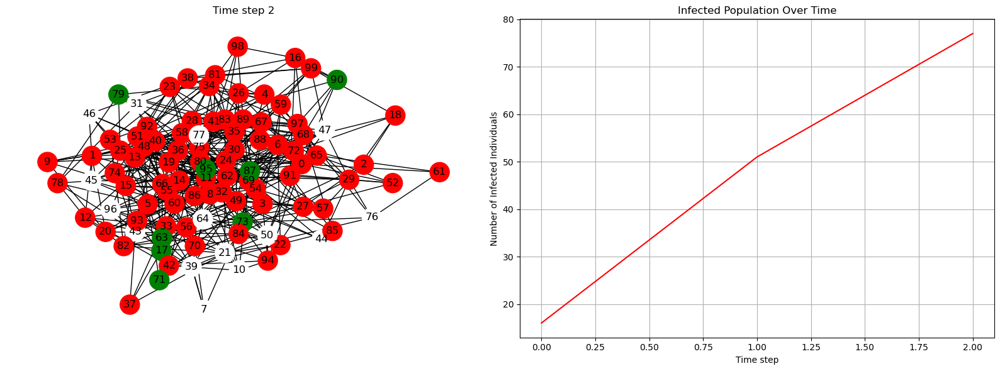

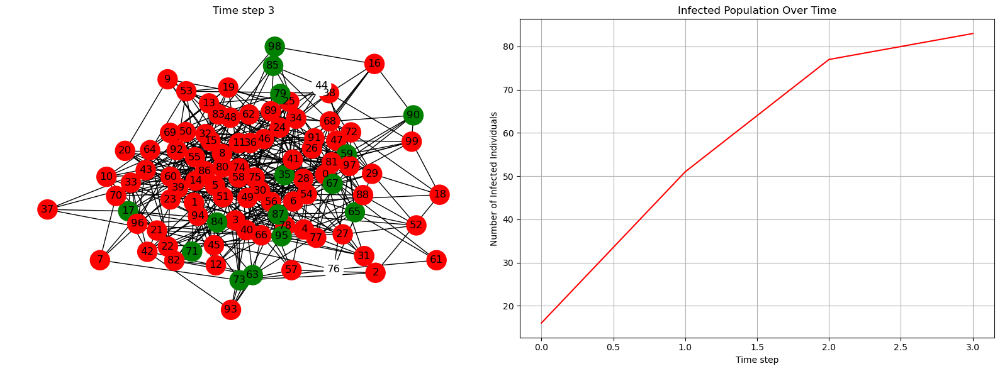

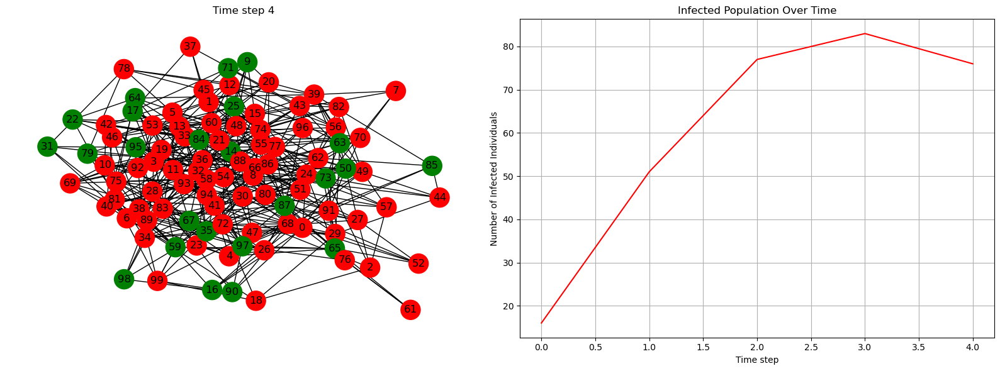

...

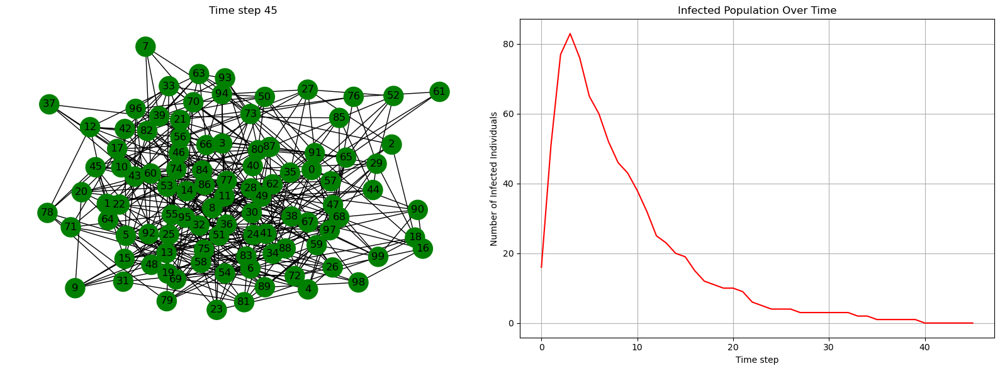

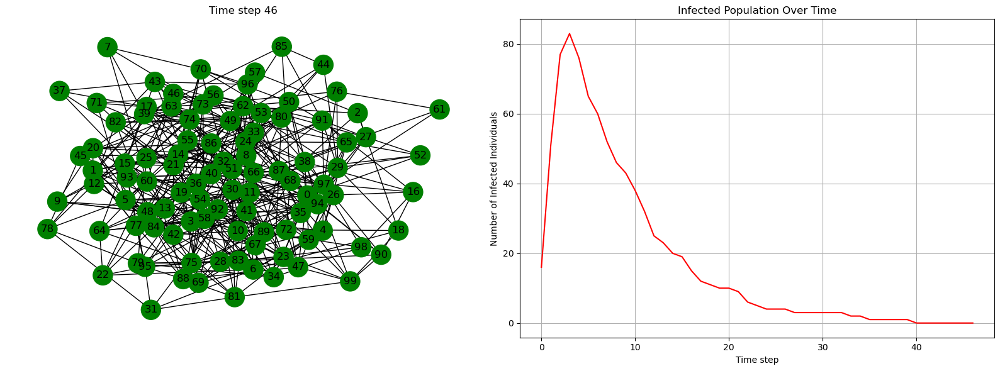

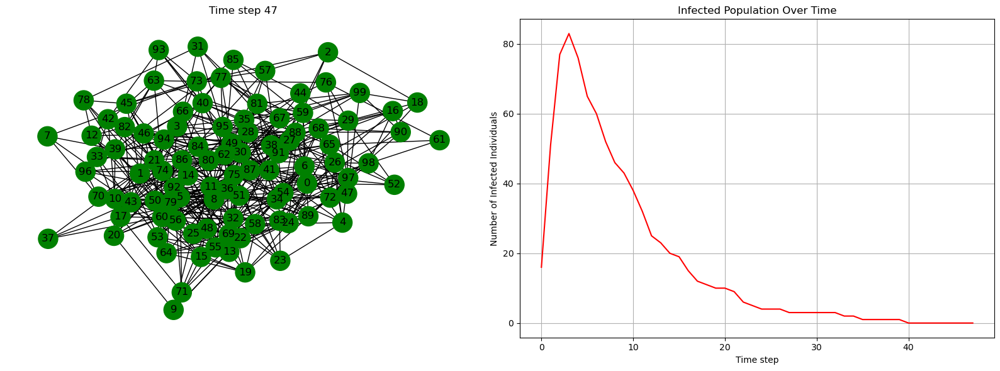

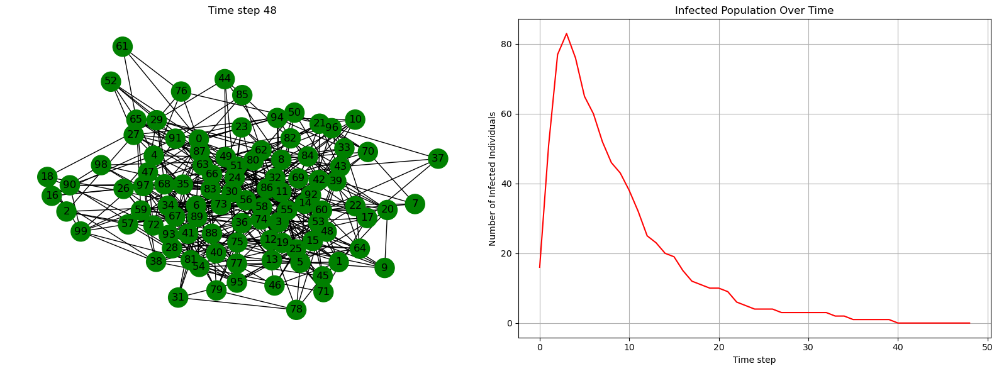

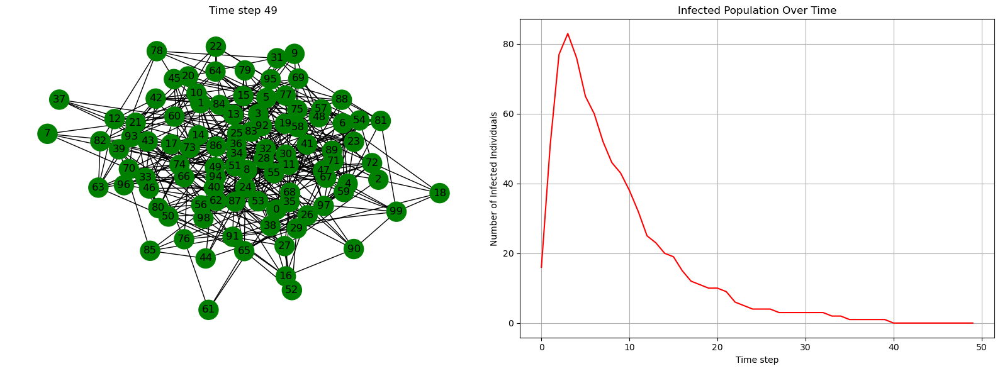

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

# Parameters
beta = 0.3  # Infection probability
gamma = 0.1  # Recovery probability
num_nodes = 100  # Number of nodes in the network
initial_infected = 5  # Initial number of infected nodes
n_steps = 50  # Number of time steps

# Create a random network
G = nx.erdos_renyi_graph(num_nodes, 0.1)

# Initialize node states (0: Susceptible, 1: Infected, 2: Recovered)
states = np.zeros(num_nodes, dtype=int)

# Randomly infect initial nodes
initial_infected_nodes = np.random.choice(num_nodes, initial_infected, replace=False)
states[initial_infected_nodes] = 1

# Function to update the network
def update_network(G, states, beta, gamma):
    new_states = states.copy()
    for node in G.nodes:
        if states[node] == 1:  # Infected
            if np.random.rand() < gamma:
                new_states[node] = 2  # Recovered
            else:
                for neighbor in G.neighbors(node):
                    if states[neighbor] == 0 and np.random.rand() < beta:
                        new_states[neighbor] = 1  # Infect the neighbor
    return new_states

# Arrays to store the number of infected individuals over time
infected_counts = np.zeros(n_steps)

# Simulation loop
for step in range(n_steps):
    states = update_network(G, states, beta, gamma)
    infected_counts[step] = np.sum(states == 1)

    # Plot the network and the infected population
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot the network
    color_map = ['white' if state == 0 else 'red' if state == 1 else 'green' for state in states]
    nx.draw(G, node_color=color_map, with_labels=True, node_size=500, cmap=plt.cm.rainbow, ax=axes[0])
    axes[0].set_title(f'Time step {step}')

    # Plot the infected population over time
    axes[1].plot(range(step + 1), infected_counts[:step + 1], color='red')
    axes[1].set_xlabel('Time step')
    axes[1].set_ylabel('Number of Infected Individuals')
    axes[1].set_title('Infected Population Over Time')
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


# ABM with network 2
Check the article [*A network agent based infection model with Mesa*](https://dmnfarrell.github.io/bioinformatics/abm-mesa-network)

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import imageio

# Parameters
beta = 0.3  # Infection probability
gamma = 0.1  # Recovery probability
num_nodes = 100  # Number of nodes in the network
initial_infected = 5  # Initial number of infected nodes
n_steps = 50  # Number of time steps
save_dir = "../03_output/figures"  # Directory to save images

# Create directory if it does not exist
os.makedirs(save_dir, exist_ok=True)

# Create a random network
G = nx.erdos_renyi_graph(num_nodes, 0.1)

# Initialize node states (0: Susceptible, 1: Infected, 2: Recovered)
states = np.zeros(num_nodes, dtype=int)

# Randomly infect initial nodes
initial_infected_nodes = np.random.choice(num_nodes, initial_infected, replace=False)
states[initial_infected_nodes] = 1

# Function to update the network
def update_network(G, states, beta, gamma):
    new_states = states.copy()
    for node in G.nodes:
        if states[node] == 1:  # Infected
            if np.random.rand() < gamma:
                new_states[node] = 2  # Recovered
            else:
                for neighbor in G.neighbors(node):
                    if states[neighbor] == 0 and np.random.rand() < beta:
                        new_states[neighbor] = 1  # Infect the neighbor
    return new_states

# Arrays to store the number of infected individuals over time
infected_counts = np.zeros(n_steps)

# Simulation loop
filenames = []
for step in range(n_steps):
    states = update_network(G, states, beta, gamma)
    infected_counts[step] = np.sum(states == 1)

    # Plot the network and the infected population
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot the network
    color_map = ['white' if state == 0 else 'red' if state == 1 else 'green' for state in states]
    nx.draw(G, node_color=color_map, with_labels=True, node_size=500, cmap=plt.cm.rainbow, ax=axes[0])
    axes[0].set_title(f'Time step {step}')

    # Plot the infected population over time
    axes[1].plot(range(step + 1), infected_counts[:step + 1], color='red')
    axes[1].set_xlabel('Time step')
    axes[1].set_ylabel('Number of Infected Individuals')
    axes[1].set_title('Infected Population Over Time')
    axes[1].grid(True)

    plt.tight_layout()

    # Save the figure
    filename = os.path.join(save_dir, f'SIRmod01_net_{step:03d}.png')
    #SIRmod01_net_t0.png
    filenames.append(filename)
    plt.savefig(filename)
    plt.close(fig)

# Create a GIF from the saved images
with imageio.get_writer(os.path.join(save_dir, 'sir_simulation.gif'), mode='I', duration=0.5) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

print(f"GIF saved at {os.path.join(save_dir, 'sir_simulation.gif')}")


/opt/anaconda3/lib/python3.9/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
/var/folders/gh/2cf49j_x4q533sfszrhs7szc0000gn/T/ipykernel_5650/4238762321.py:77: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


GIF saved at ../03_output/figures/sir_simulation.gif
